In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
pd.options.display.max_columns=None
import warnings

In [2]:
train = pd.read_csv('/kaggle/input/movies-ultimate-metrics-features-and-metadata/Top Movies (Cleaned Data).csv')
train.head()

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,id,Movie Name,Release Date,Production Budget (USD),Domestic Gross (USD),Worldwide Gross (USD),Domestic Box Office (USD),International Box Office (USD),Worldwide Box Office (USD),Est. Domestic DVD Sales (USD),Est. Domestic Blu-ray Sales (USD),Total Est. Domestic Video Sales (USD),Opening Weekend (USD),Legs,Infl. Adj. Dom. BO (USD),Video Release,MPAA Rating,Running Time (minutes),Franchise,Keywords,Source,Genre,Production Method,Creative Type,Production/Financing Companies,Production Countries,Languages,Domestic Releases,International Releases,Theater counts,Domestic Share Percentage,Movie URL
0,1,Star Wars Ep. VII: The Force Awakens,2015-12-16,533200000,936662225,2056046835,936662225.0,1.119385e+09,2.056047e+09,39601100.0,151559711.0,191160811.0,247966675.0,3.78,1.191448e+09,2016-04-01,PG-13,136.0,Star Wars,"Space Opera,Good vs. Evil,Delayed Sequel,Inter...",Original Screenplay,Adventure,"Animation,Live Action",Science Fiction,"Lucasfilm,Bad Robot",United States,English,"December 18th, 2015 (IMAX) byWalt DisneyDecemb...","December 16th, 2015 (Wide) (Belgium)December 1...","4,134 opening theaters/4,134 max. theaters, 9....",45.6,https://www.the-numbers.com/movie/Star-Wars-Ep...
1,2,Avatar: The Way of Water,2022-12-09,460000000,684075767,2315589775,684075767.0,1.631514e+09,2.315590e+09,7771432.0,11365092.0,19136524.0,134100226.0,5.10,6.935964e+08,2023-03-28,PG-13,190.0,Avatar,"Action Adventure,Delayed Sequel,Humans as Alie...",Original Screenplay,Action,"Animation,Live Action",Science Fiction,"Lightstorm Entertainment,20th Century Studios,...",United States,English,"December 16th, 2022 (Wide) by20th Century Stud...","December 9th, 2022 (Wide) (Finland)December 14...","4,202 opening theaters/4,340 max. theaters, 11...",29.5,https://www.the-numbers.com/movie/Avatar-The-W...
2,3,Indiana Jones and the Dial of Destiny,2023-06-28,402300000,174480468,383963057,174480468.0,2.094826e+08,3.839631e+08,NaN,NaN,NaN,60368101.0,2.89,1.744805e+08,2023-08-29,PG-13,142.0,Indiana Jones,"1960s,Space Program,Nazis Outside of World War...",Original Screenplay,Adventure,Live Action,Historical Fiction,"Lucasfilm,Walt Disney Pictures,Paramount Pictures",United States,English,"June 30th, 2023 (Wide) byWalt DisneyJune 30th,...","June 28th, 2023 (Wide) (Australia)June 28th, 2...","4,600 opening theaters/4,600 max. theaters, 4....",45.4,https://www.the-numbers.com/movie/Indiana-Jone...
3,4,Avengers: Endgame,2019-04-23,400000000,858373000,2748242781,858373000.0,1.889870e+09,2.748243e+09,23961293.0,83907696.0,107868989.0,357115007.0,2.40,1.010181e+09,2019-07-30,PG-13,181.0,Marvel Cinematic UniverseAvengers,"Ensemble,Marvel Comics,Animal Lead,Non-Chronol...",Based on Comic/Graphic Novel,Action,"Animation,Live Action",Super Hero,Marvel Studios,United States,English,"April 26th, 2019 (Wide) byWalt DisneyApril 26t...","April 23rd, 2019 (Limited) (China)April 24th, ...","4,662 opening theaters/4,662 max. theaters, 8....",31.2,https://www.the-numbers.com/movie/Avengers-End...
4,5,Mission: Impossible—The Final Reckoning,2025-05-21,400000000,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://www.the-numbers.com/movie/Mission-Impo...


In [3]:
test = pd.read_csv('/kaggle/input/movies-ultimate-metrics-features-and-metadata/Top Movies (Raw Data).csv')
test.head()

,Unnamed: 0,ReleaseDate,Movie,ProductionBudget,DomesticGross,WorldwideGross,Movie URL,Domestic Box Office,International Box Office,Worldwide Box Office,Est. Domestic DVD Sales,Est. Domestic Blu-ray Sales,Total Est. Domestic Video Sales,Opening Weekend:,Legs:,Domestic Share:,Production Budget:,Theater counts:,Infl. Adj. Dom. BO,Domestic Releases:,International Releases:,Video Release:,MPAA Rating:,Running Time:,Franchise:,Comparisons:,Keywords:,Source:,Genre:,Production Method:,Creative Type:,Production/Financing Companies:,Production Countries:,Languages:
0,1,16-Dec-15,Star Wars Ep. VII: The Force Awakens,"$533,200,000","$936,662,225","$2,056,046,835",https://www.the-numbers.com/movie/Star-Wars-Ep...,"$936,662,225","$1,119,384,610","$2,056,046,835","$39,601,100","$151,559,711","$191,160,811","$247,966,675 (26.5% of total gross)",3.78 (domestic box office/biggest weekend),45.6% (domestic box office/worldwide),"$533,200,000 (worldwide box office is 3.9 time...","4,134 opening theaters/4,134 max. theaters, 9....","$1,191,447,782","December 18th, 2015 (IMAX) byWalt DisneyDecemb...","December 16th, 2015 (Wide) (Belgium)December 1...","April 1st, 2016 byDisney/Lucasfilm",PG-13for sci-fi action violence.(Rating bullet...,136 minutes,Star Wars,"All-Time Top-Grossing FilmsBlockbusters, 2015v...","Space Opera,Good vs. Evil,Delayed Sequel,Inter...",Original Screenplay,Adventure,Animation/Live Action,Science Fiction,"Lucasfilm,Bad Robot",United States,English
1,2,9-Dec-22,Avatar: The Way of Water,"$460,000,000","$684,075,767","$2,315,589,775",https://www.the-numbers.com/movie/Avatar-The-W...,"$684,075,767","$1,631,514,008","$2,315,589,775","$7,771,432","$11,365,092","$19,136,524","$134,100,226 (19.6% of total gross)",5.10 (domestic box office/biggest weekend),29.5% (domestic box office/worldwide),"$460,000,000 (worldwide box office is 5.0 time...","4,202 opening theaters/4,340 max. theaters, 11...","$693,596,368","December 16th, 2022 (Wide) by20th Century Stud...","December 9th, 2022 (Wide) (Finland)December 14...","March 28th, 2023 byWalt Disney Home Entertainment",PG-13for sequences of strong violence and inte...,190 minutes,Avatar,All-Time Top-Grossing Filmsvs. AvatarCreate yo...,"Action Adventure,Delayed Sequel,Humans as Alie...",Original Screenplay,Action,Animation/Live Action,Science Fiction,"Lightstorm Entertainment,20th Century Studios,...",United States,English
2,3,28-Jun-23,Indiana Jones and the Dial of Destiny,"$402,300,000","$174,480,468","$383,963,057",https://www.the-numbers.com/movie/Indiana-Jone...,"$174,480,468","$209,482,589","$383,963,057",NaN,NaN,NaN,"$60,368,101 (34.6% of total gross)",2.89 (domestic box office/biggest weekend),45.4% (domestic box office/worldwide),"$402,300,000 (worldwide box office is 1.0 time...","4,600 opening theaters/4,600 max. theaters, 4....","$174,480,468","June 30th, 2023 (Wide) byWalt DisneyJune 30th,...","June 28th, 2023 (Wide) (Australia)June 28th, 2...","August 29th, 2023 byDisney/Lucasfilm","PG-13for sequences of violence and action, lan...",142 minutes,Indiana Jones,vs. Mission: Impossible Dead Reckoning Part On...,"1960s,Space Program,Nazis Outside of World War...",Original Screenplay,Adventure,Live Action,Historical Fiction,"Lucasfilm,Walt Disney Pictures,Paramount Pictures",United States,English
3,4,23-Apr-19,Avengers: Endgame,"$400,000,000","$858,373,000","$2,748,242,781",https://www.the-numbers.com/movie/Avengers-End...,"$858,373,000","$1,889,869,781","$2,748,242,781","$23,961,293","$83,907,696","$107,868,989","$357,115,007 (41.6% of total gross)",2.40 (domestic box office/biggest weekend),31.2% (domestic box office/worldwide),"$400,000,000 (worldwide box office is 6.9 time...","4,662 opening theaters/4,662 max. theaters, 8....","$1,010,181,328","April 26th, 2019 (Wide) byWalt DisneyApril 26t...","April 23rd, 2019 (Limited) (China)April 24th, ...","July 30th, 2019 byWalt Disney Home Entertainment",PG-13for sequences of sci-fi violence and acti...,181 minutes,Marvel Cinematic Unive

In [4]:
combined = pd.concat([train,test])
combined.head()

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,id,Movie Name,Release Date,Production Budget (USD),Domestic Gross (USD),Worldwide Gross (USD),Domestic Box Office (USD),International Box Office (USD),Worldwide Box Office (USD),Est. Domestic DVD Sales (USD),Est. Domestic Blu-ray Sales (USD),Total Est. Domestic Video Sales (USD),Opening Weekend (USD),Legs,Infl. Adj. Dom. BO (USD),Video Release,MPAA Rating,Running Time (minutes),Franchise,Keywords,Source,Genre,Production Method,Creative Type,Production/Financing Companies,Production Countries,Languages,Domestic Releases,International Releases,Theater counts,Domestic Share Percentage,Movie URL,Unnamed: 0,ReleaseDate,Movie,ProductionBudget,DomesticGross,WorldwideGross,Domestic Box Office,International Box Office,Worldwide Box Office,Est. Domestic DVD Sales,Est. Domestic Blu-ray Sales,Total Est. Domestic Video Sales,Opening Weekend:,Legs:,Domestic Share:,Production Budget:,Theater counts:,Infl. Adj. Dom. BO,Domestic Releases:,International Releases:,Video Release:,MPAA Rating:,Running Time:,Franchise:,Comparisons:,Keywords:,Source:,Genre:,Production Method:,Creative Type:,Production/Financing Companies:,Production Countries:,Languages:
0,1,Star Wars Ep. VII: The Force Awakens,2015-12-16,533200000.0,936662225.0,2.056047e+09,936662225.0,1.119385e+09,2.056047e+09,39601100.0,151559711.0,191160811.0,247966675.0,3.78,1.191448e+09,2016-04-01,PG-13,136.0,Star Wars,"Space Opera,Good vs. Evil,Delayed Sequel,Inter...",Original Screenplay,Adventure,"Animation,Live Action",Science Fiction,"Lucasfilm,Bad Robot",United States,English,"December 18th, 2015 (IMAX) byWalt DisneyDecemb...","December 16th, 2015 (Wide) (Belgium)December 1...","4,134 opening theaters/4,134 max. theaters, 9....",45.6,https://www.the-numbers.com/movie/Star-Wars-Ep...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Avatar: The Way of Water,2022-12-09,460000000.0,684075767.0,2.315590e+09,684075767.0,1.631514e+09,2.315590e+09,7771432.0,11365092.0,19136524.0,134100226.0,5.10,6.935964e+08,2023-03-28,PG-13,190.0,Avatar,"Action Adventure,Delayed Sequel,Humans as Alie...",Original Screenplay,Action,"Animation,Live Action",Science Fiction,"Lightstorm Entertainment,20th Century Studios,...",United States,English,"December 16th, 2022 (Wide) by20th Century Stud...","December 9th, 2022 (Wide) (Finland)December 14...","4,202 opening theaters/4,340 max. theaters, 11...",29.5,https://www.the-numbers.com/movie/Avatar-The-W...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Indiana Jones and the Dial of Destiny,2023-06-28,402300000.0,174480468.0,3.839631e+08,174480468.0,2.094826e+08,3.839631e+08,NaN,NaN,NaN,60368101.0,2.89,1.744805e+08,2023-08-29,PG-13,142.0,Indiana Jones,"1960s,Space Program,Nazis Outside of World War...",Original Screenplay,Adventure,Live Action,Historical Fiction,"Lucasfilm,Walt Disney Pictures,Paramount Pictures",United States,English,"June 30th, 2023 (Wide) byWalt DisneyJune 30th,...","June 28th, 2023 (Wide) (Australia)June 28th, 2...","4,600 opening theaters/4,600 max. theaters, 4....",45.4,https://www.the-numbers.com/movie/Indiana-Jone...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,Avengers: Endgame,2019-04-23,400000000.0,858373000.0,2.748243e+09,858373000.0,1.889870e+09,2.748243e+09,23961293.0,83907696.0,107868989.0,357115007.0,2.40,1.010181e+09,2019-07-30,PG-13,181.0,Marvel Cinematic UniverseAvengers,"Ensemble,Marvel Comics,Animal Lead,Non-Chronol...",Based on Comic/Graphic Novel,Action,"Animation,Live Action",Super Hero,Marvel Studios,United States,English,"April 26th, 2019 (Wide) byWalt DisneyApril 26t...","April 23rd, 2019 (Limited) (China)April 24th, ...","4,662 opening theaters/4,662 max. theaters, 8....",31.2,https://www.the-numbers.com/movie/Avengers-End...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [6]:
combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13138 entries, 0 to 6568
Data columns (total 65 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   id                                     6569 non-null   object 
 1   Movie Name                             6569 non-null   object 
 2   Release Date                           6420 non-null   object 
 3   Production Budget (USD)                6569 non-null   float64
 4   Domestic Gross (USD)                   6569 non-null   float64
 5   Worldwide Gross (USD)                  6569 non-null   float64
 6   Domestic Box Office (USD)              5847 non-null   float64
 7   International Box Office (USD)         5044 non-null   float64
 8   Worldwide Box Office (USD)             5044 non-null   float64
 9   Est. Domestic DVD Sales (USD)          2566 non-null   float64
 10  Est. Domestic Blu-ray Sales (USD)      2156 non-null   float64
 11  Total Es

In [7]:
combined.dtypes

id                                  object
Movie Name                          object
Release Date                        object
Production Budget (USD)            float64
Domestic Gross (USD)               float64
                                    ...   
Production Method:                  object
Creative Type:                      object
Production/Financing Companies:     object
Production Countries:               object
Languages:                          object
Length: 65, dtype: object

In [8]:
combined.columns

Index(['id', 'Movie Name', 'Release Date', 'Production Budget (USD)',
       'Domestic Gross (USD)', 'Worldwide Gross (USD)',
       'Domestic Box Office (USD)', 'International Box Office (USD)',
       'Worldwide Box Office (USD)', 'Est. Domestic DVD Sales (USD)',
       'Est. Domestic Blu-ray Sales (USD)',
       'Total Est. Domestic Video Sales (USD)', 'Opening Weekend (USD)',
       'Legs', 'Infl. Adj. Dom. BO (USD)', 'Video Release', 'MPAA Rating',
       'Running Time (minutes)', 'Franchise', 'Keywords', 'Source', 'Genre',
       'Production Method', 'Creative Type', 'Production/Financing Companies',
       'Production Countries', 'Languages', 'Domestic Releases',
       'International Releases', 'Theater counts', 'Domestic Share Percentage',
       'Movie URL', 'Unnamed: 0', 'ReleaseDate', 'Movie', 'ProductionBudget',
       'DomesticGross', 'WorldwideGross', 'Domestic Box Office',
       'International Box Office', 'Worldwide Box Office',
       'Est. Domestic DVD Sales', 'Est.

In [9]:
combined.describe().T

,count,mean,std,min,25%,50%,75%,max
Production Budget (USD),6569.0,3.301912e+07,4.507580e+07,86.0,5000000.00,17000000.00,4.000000e+07,5.332000e+08
Domestic Gross (USD),6569.0,4.249764e+07,7.314075e+07,0.0,1083350.00,16204793.00,5.187238e+07,9.366622e+08
Worldwide Gross (USD),6569.0,9.451553e+07,1.879960e+08,0.0,3771345.00,27342246.00,9.762872e+07,2.923706e+09
Domestic Box Office (USD),5847.0,4.774534e+07,7.589244e+07,264.0,4237802.00,21567853.00,5.804631e+07,9.366622e+08
International Box Office (USD),5044.0,6.774495e+07,1.347470e+08,17.0,2223474.50,18813760.00,6.999998e+07,2.138484e+09
Worldwide Box Office (USD),5044.0,1.201200e+08,2.076215e+08,17.0,11797530.50,46286584.50,1.370919e+08,2.923706e+09
Est. Domestic DVD Sales (USD),2566.0,1.689014e+07,3.060324e+07,3060.0,1920015.25,7271108.00,1.939742e+07,3.700262e+08
Est. Domestic Blu-ray Sales (USD),2156.0,7.812575e+06,1.525850e+07,724.0,787427.25,2379845.00,7.657140e+06,2.224846e+08
Total Est. Domestic Video Sales (USD),2750.0,2.188510e+07,3.751239e+07,724.0,2431747.25,9488031.00,2.516179e+07,4.325350e+08
Opening Weekend (USD),5396.0,1.355373e+07,2.335250e+07,24.0,229096.25,6256853.00,1.633832e+07,3.571150e+08


In [10]:
combined.shape

(13138, 65)

In [21]:
combined.kurt

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


<bound method DataFrame.kurt of        id                               Movie Name Release Date  \
0       1     Star Wars Ep. VII: The Force Awakens   2015-12-16   
1       2                 Avatar: The Way of Water   2022-12-09   
2       3    Indiana Jones and the Dial of Destiny   2023-06-28   
3       4                        Avengers: Endgame   2019-04-23   
4       5  Mission: Impossible—The Final Reckoning   2025-05-21   
...   ...                                      ...          ...   
6564  NaN                                      NaN          NaN   
6565  NaN                                      NaN          NaN   
6566  NaN                                      NaN          NaN   
6567  NaN                                      NaN          NaN   
6568  NaN                                      NaN          NaN   

      Production Budget (USD)  Domestic Gross (USD)  Worldwide Gross (USD)  \
0                 533200000.0           936662225.0           2.056047e+09   
1      

In [22]:
cat_cols = combined.select_dtypes(include='object')

In [23]:
for i in cat_cols:
    (combined[i].value_counts())
    print(i)
    print('_'*50)

id
__________________________________________________
Movie Name
__________________________________________________
Release Date
__________________________________________________
Video Release
__________________________________________________
MPAA Rating
__________________________________________________
Franchise
__________________________________________________
Keywords
__________________________________________________
Source
__________________________________________________
Genre
__________________________________________________
Production Method
__________________________________________________
Creative Type
__________________________________________________
Production/Financing Companies
__________________________________________________
Production Countries
__________________________________________________
Languages
__________________________________________________
Domestic Releases
__________________________________________________
International Releases
_______________

In [24]:
num_cols = combined.select_dtypes(include='number')

In [25]:
for i in num_cols:
    (combined[i].value_counts())
    print(i)
    print('_'*50)

Production Budget (USD)
__________________________________________________
Domestic Gross (USD)
__________________________________________________
Worldwide Gross (USD)
__________________________________________________
Domestic Box Office (USD)
__________________________________________________
International Box Office (USD)
__________________________________________________
Worldwide Box Office (USD)
__________________________________________________
Est. Domestic DVD Sales (USD)
__________________________________________________
Est. Domestic Blu-ray Sales (USD)
__________________________________________________
Total Est. Domestic Video Sales (USD)
__________________________________________________
Opening Weekend (USD)
__________________________________________________
Legs
__________________________________________________
Infl. Adj. Dom. BO (USD)
__________________________________________________
Running Time (minutes)
__________________________________________________
Domestic 

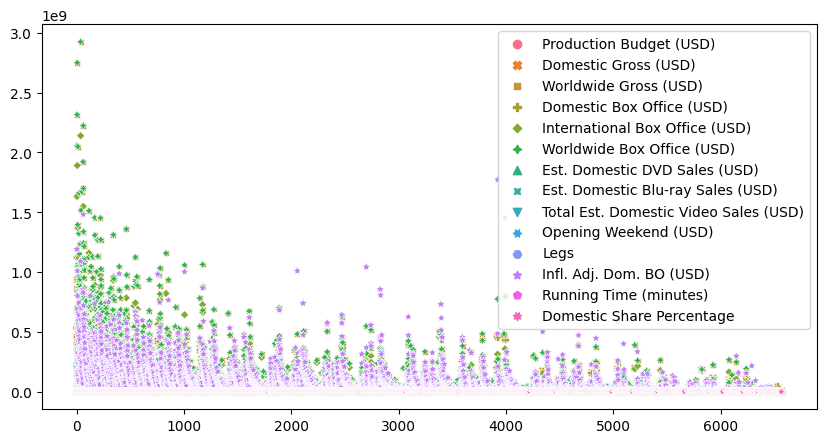

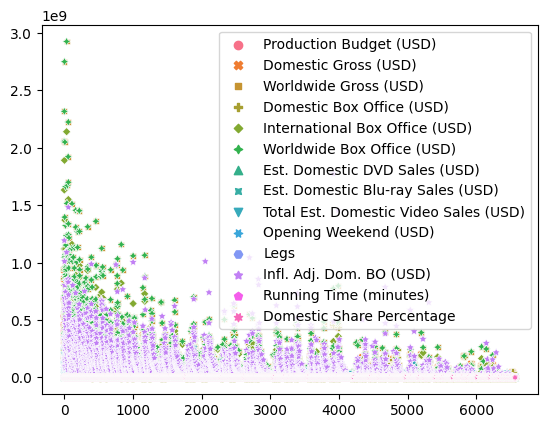

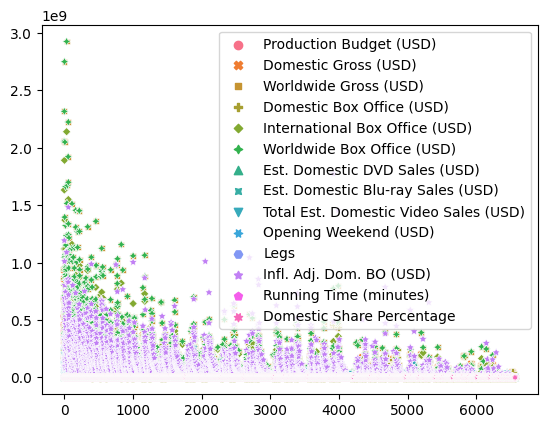

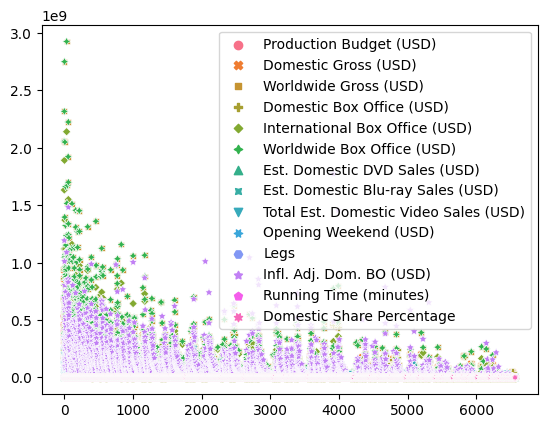

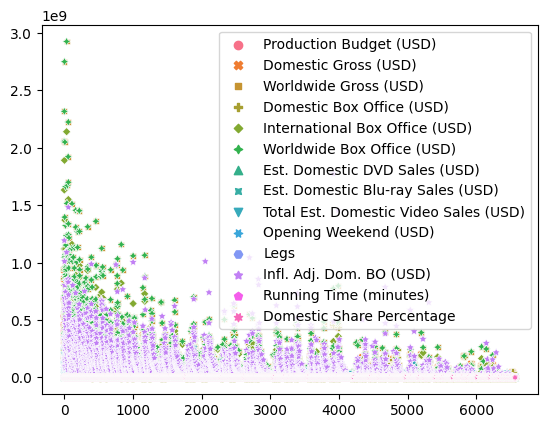

...

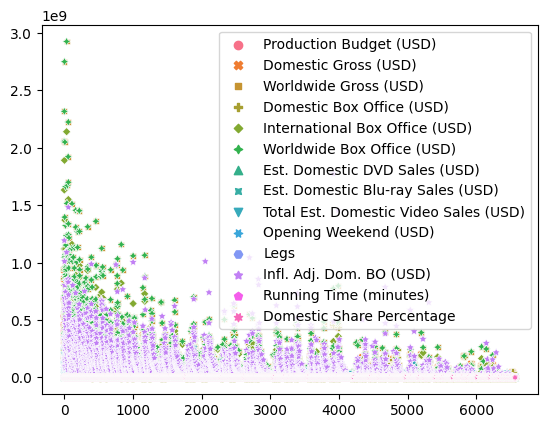

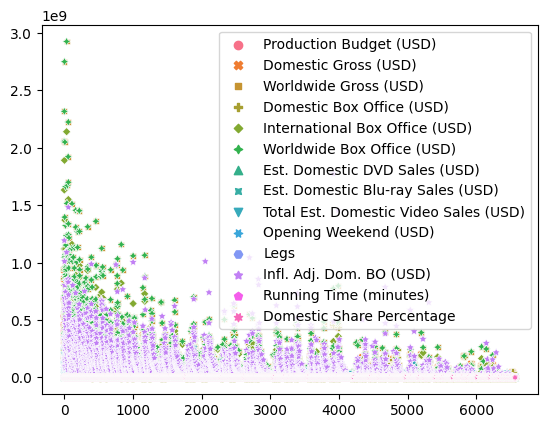

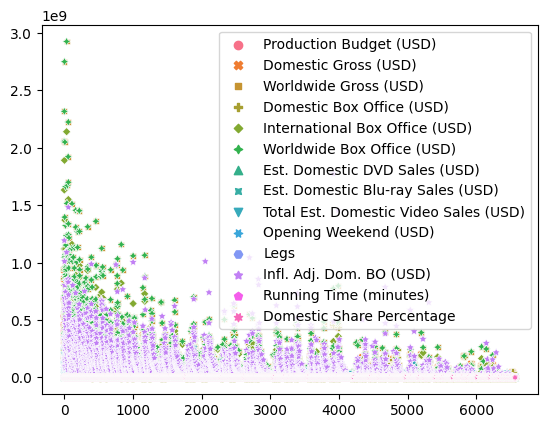

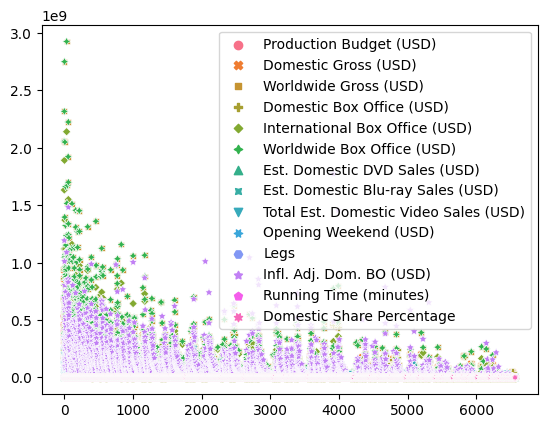

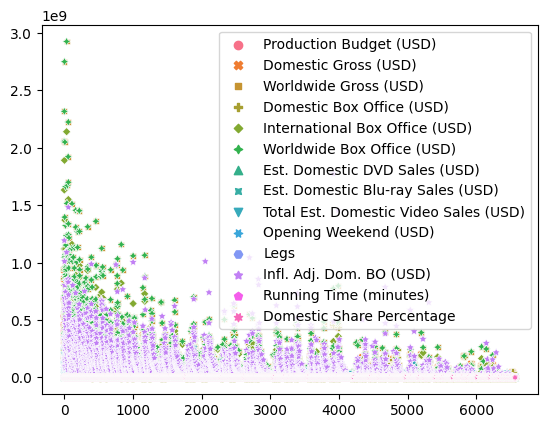

In [30]:
x = 1
plt.figure(figsize=(10,5))
cat_cols = combined.select_dtypes(include='object')
for i in cat_cols:
    sns.scatterplot(data=combined)
    print('\n')
    plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


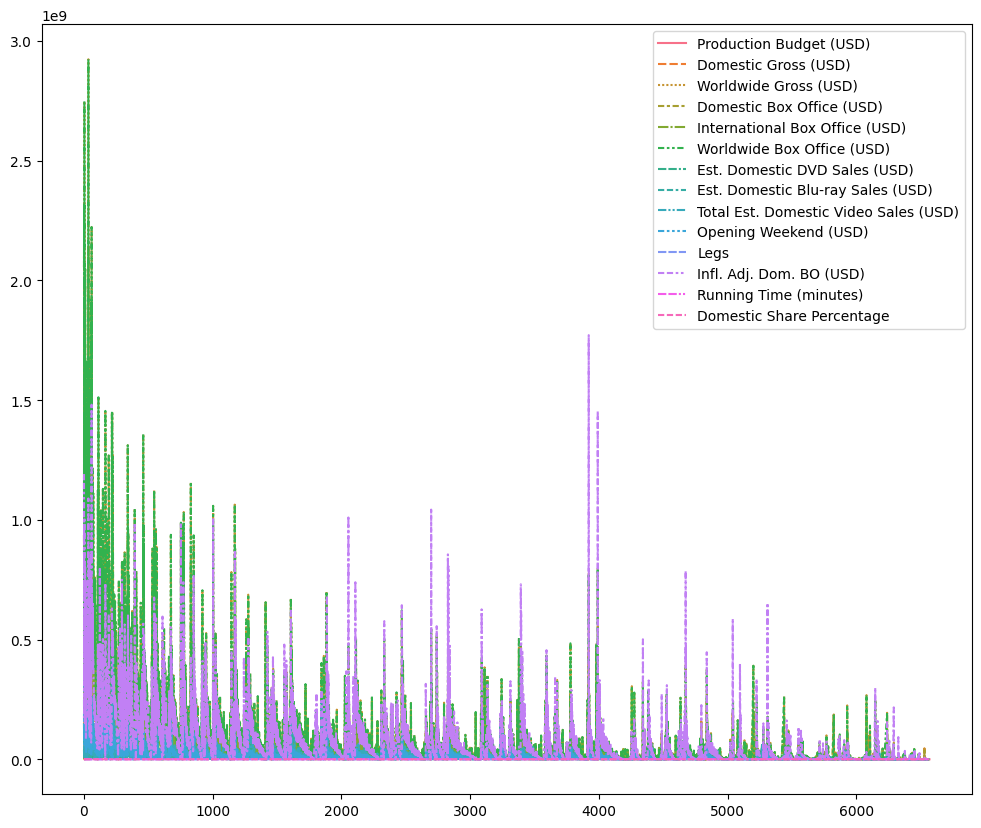

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


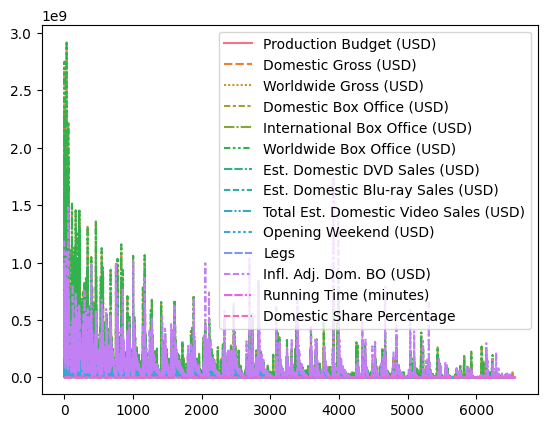

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


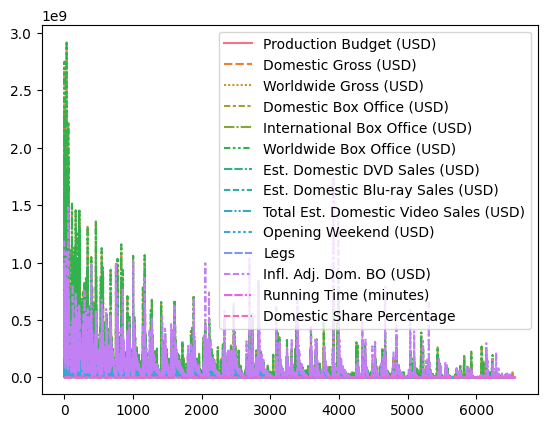

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


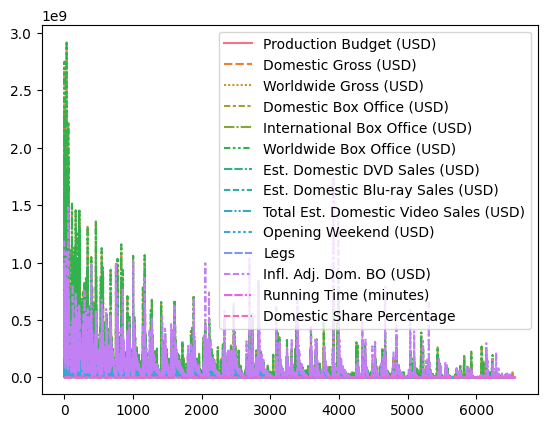

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


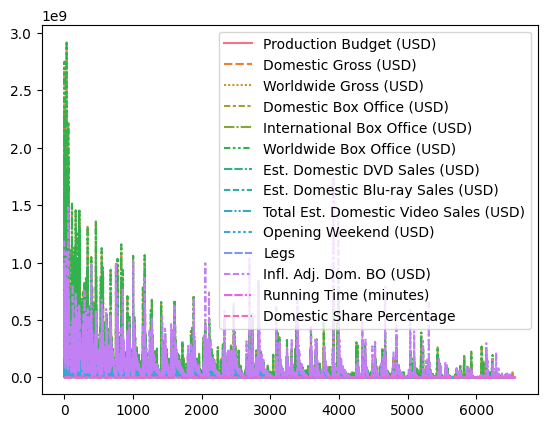

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


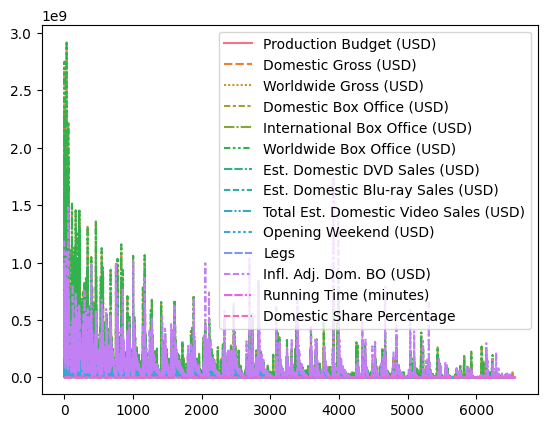

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


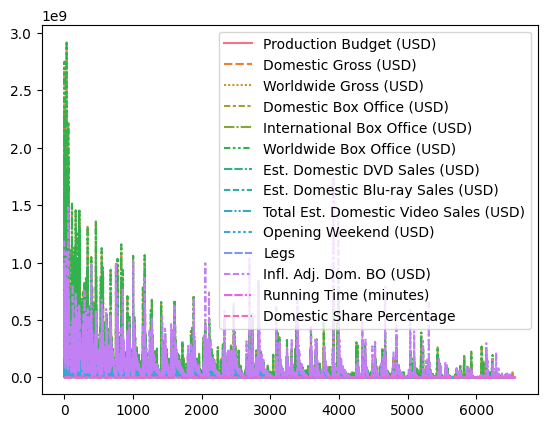

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


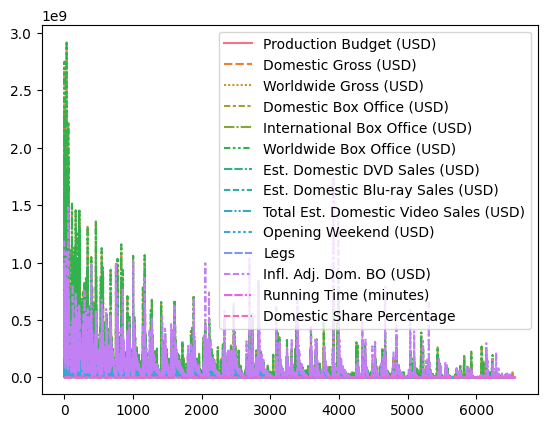

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


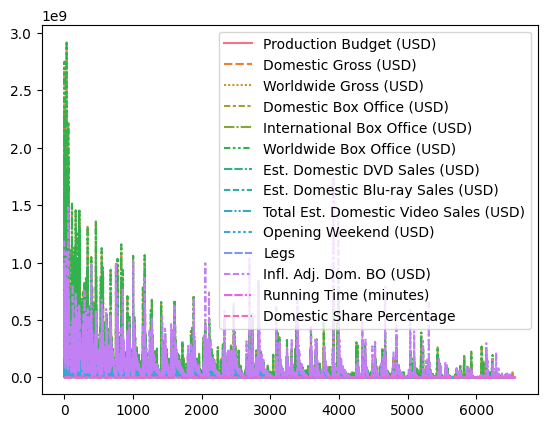

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


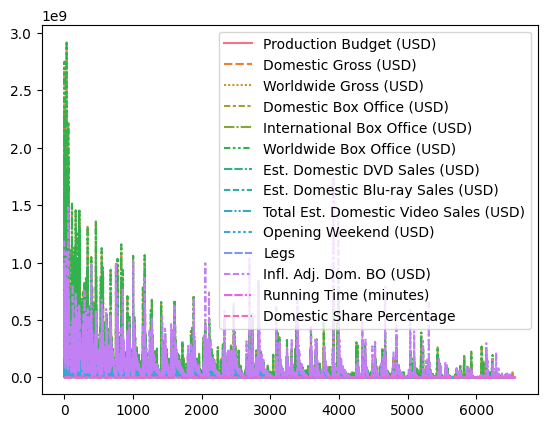

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


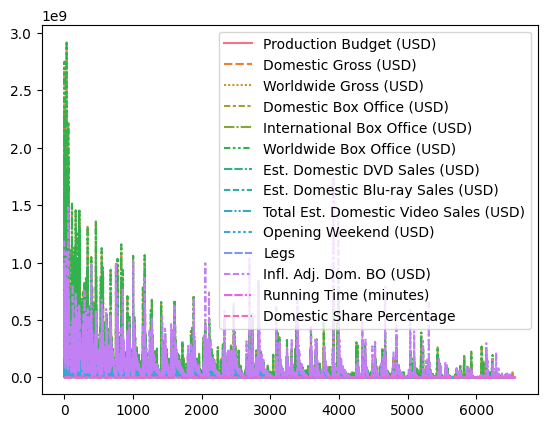

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


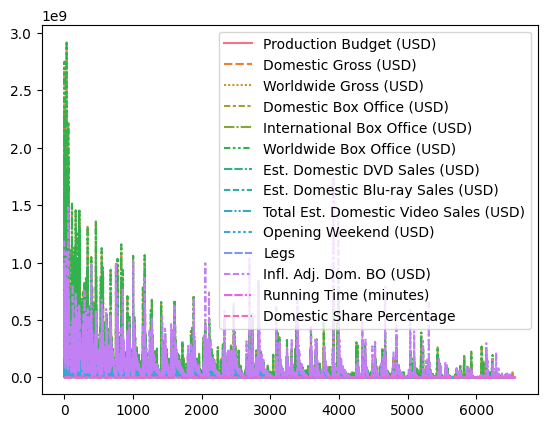

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


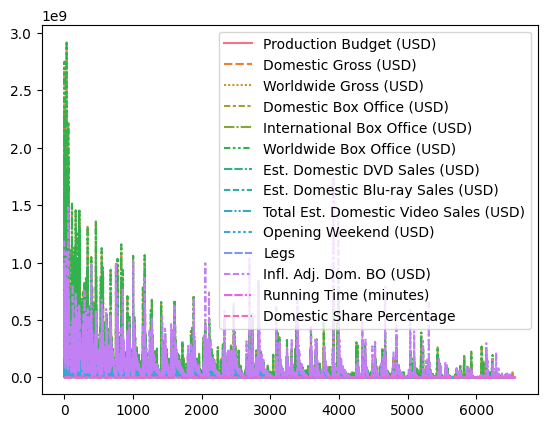

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


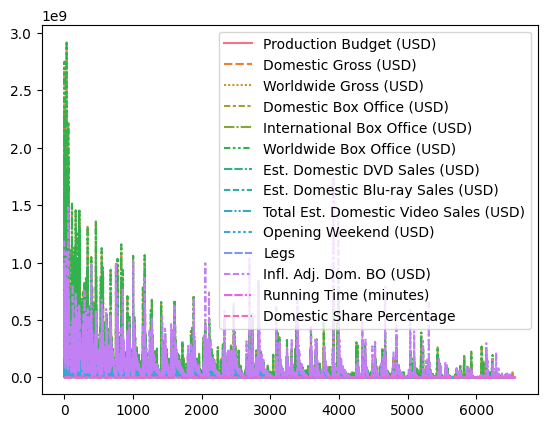

In [33]:
x = 1
plt.figure(figsize=(12,10))
num_cols = combined.select_dtypes(include='number')
for i in num_cols:
    sns.lineplot(data=combined)
    print('\n')
    plt.show() 

<Axes: >

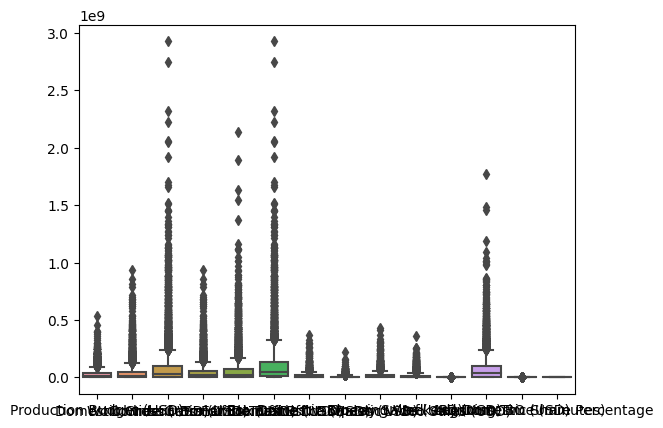

In [34]:
sns.boxplot(combined)

<Axes: >

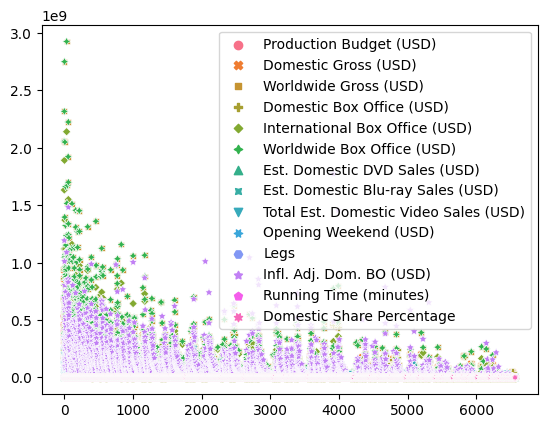

In [35]:
sns.scatterplot(combined)

<Axes: >

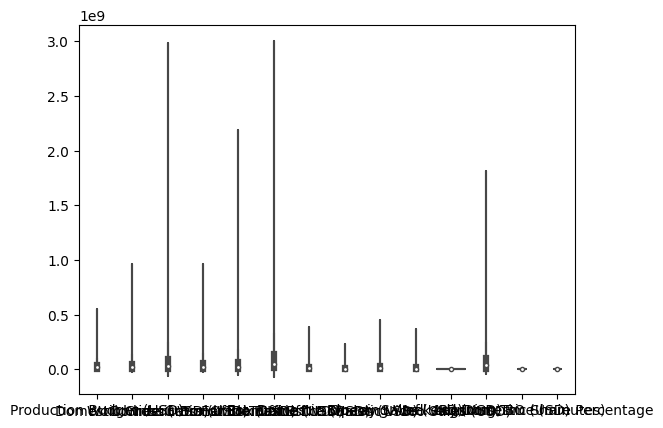

In [36]:
sns.violinplot(combined)

<Axes: >

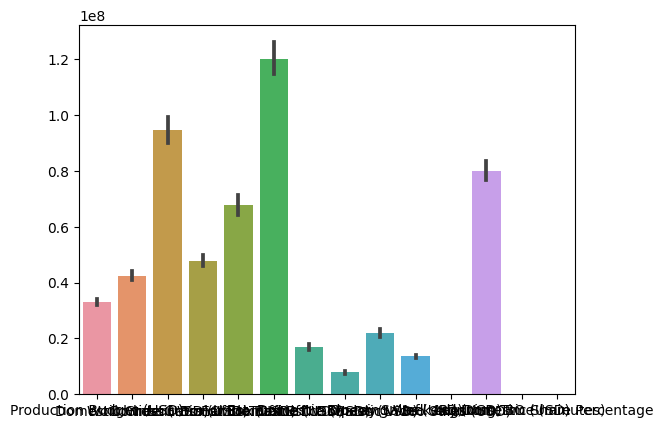

In [37]:
sns.barplot(combined)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

<Axes: ylabel='Density'>

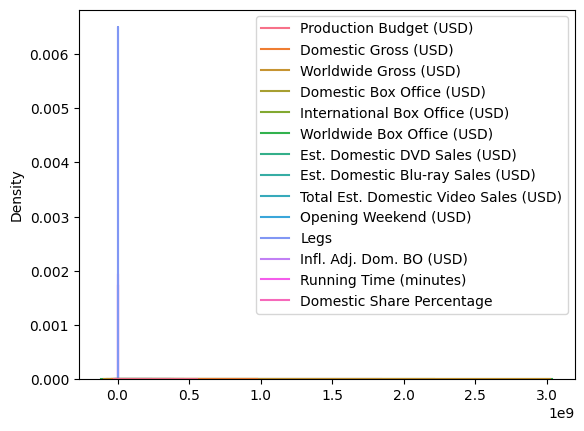

In [38]:
sns.kdeplot(combined)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

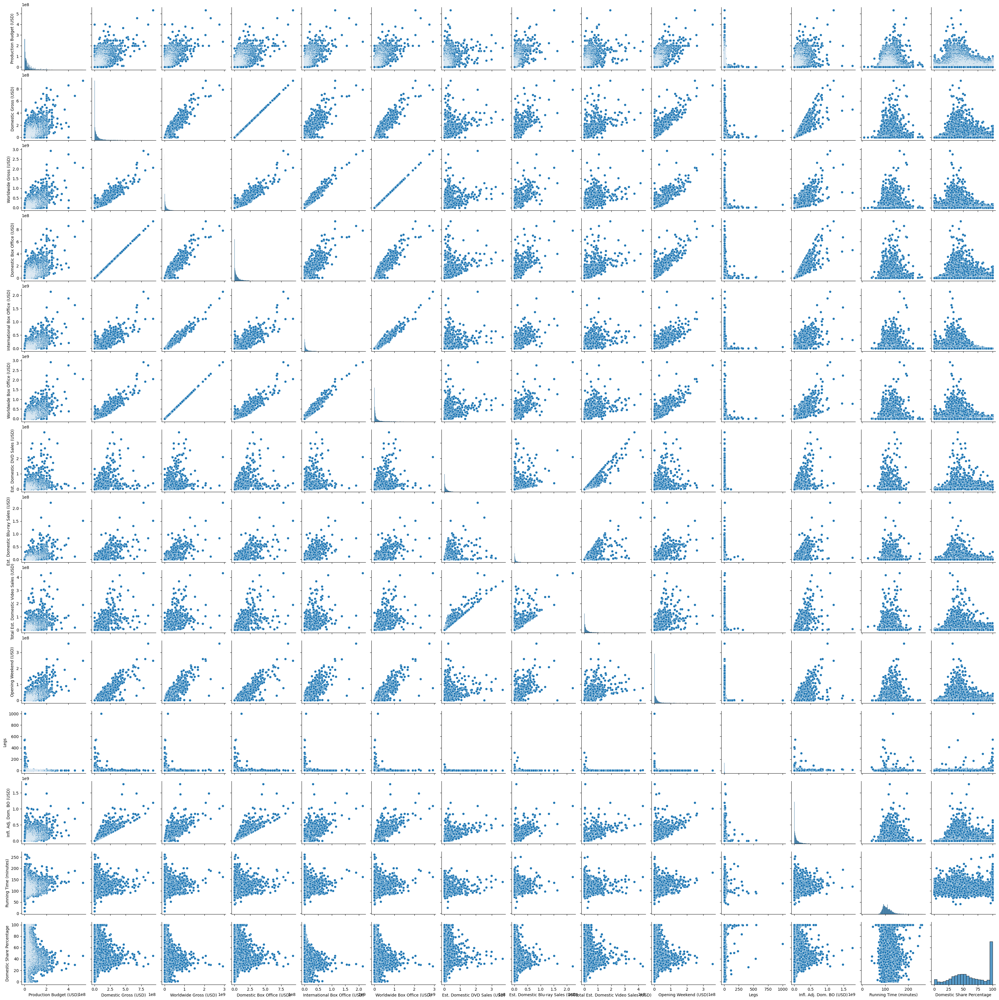

In [39]:
sns.pairplot(combined)

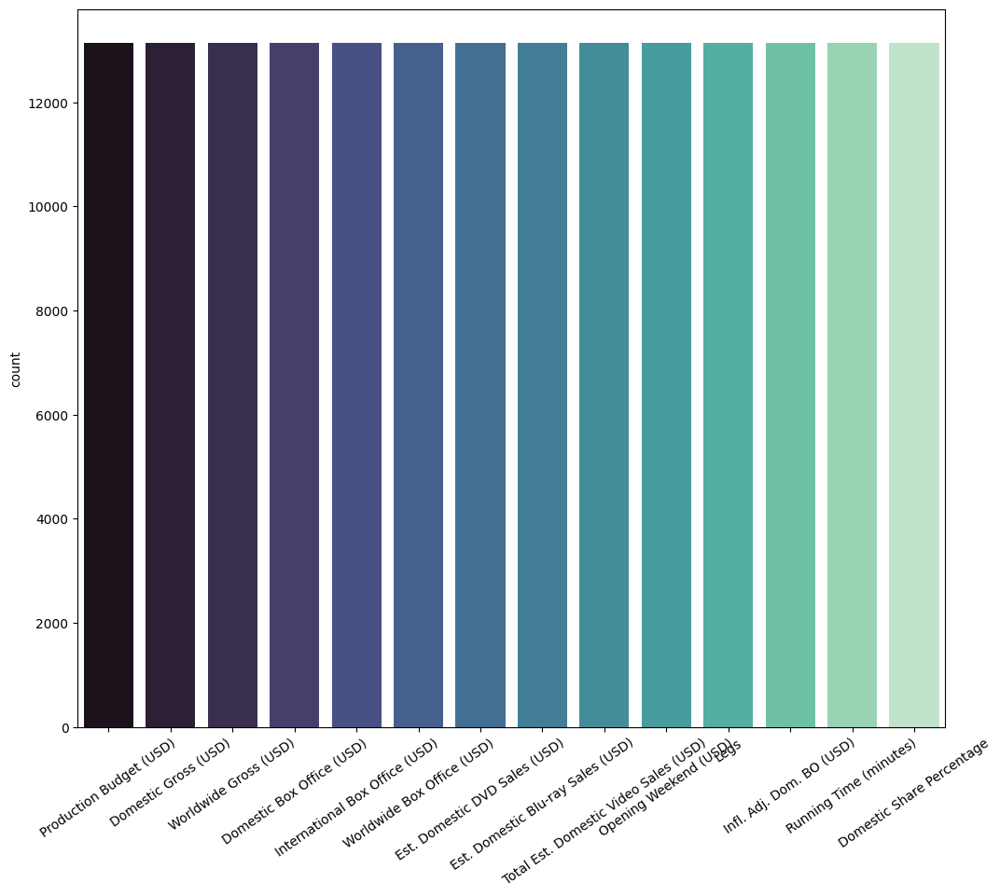

In [42]:
plt.figure(figsize=(12,10))
sns.countplot(data=combined,palette='mako');
plt.xticks(rotation=35);
plt.show()

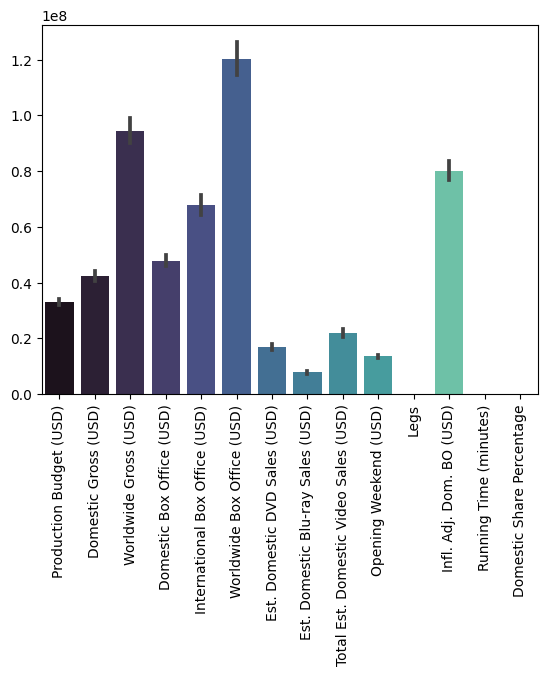

In [45]:
sns.barplot(data=combined,palette='mako');
plt.xticks(rotation=90)
plt.show()

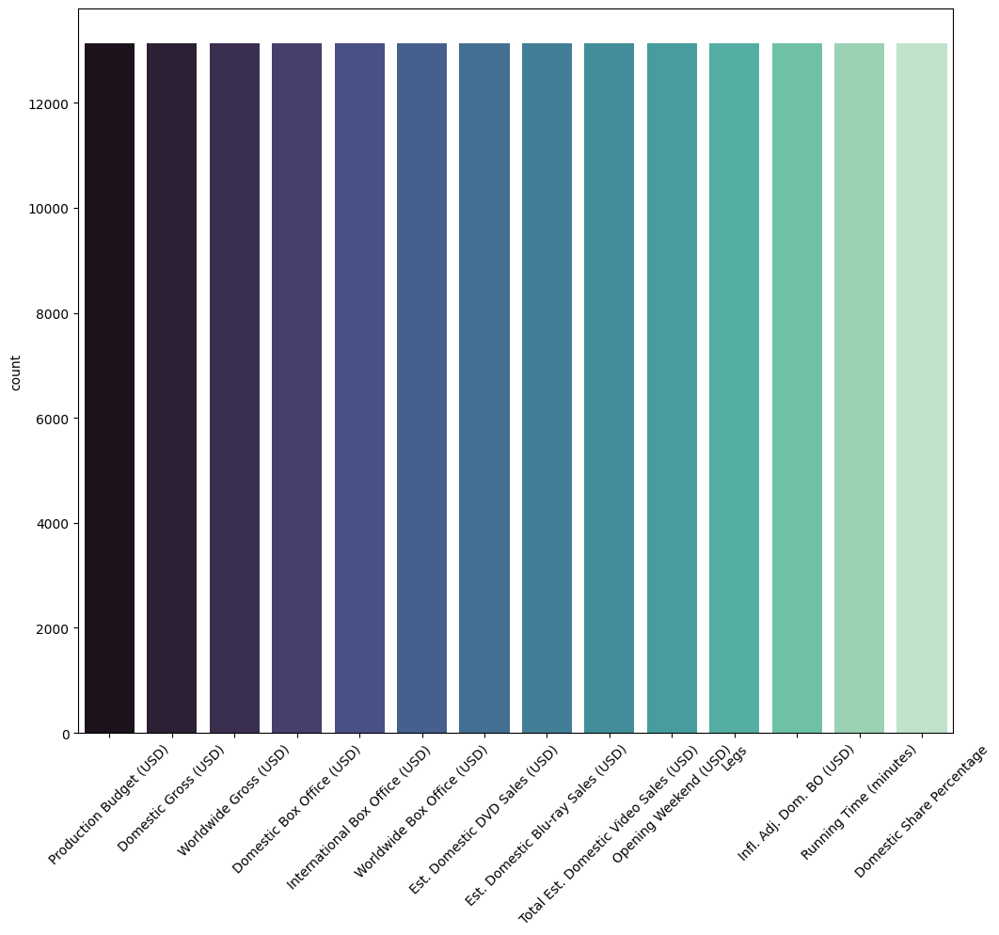

In [47]:
plt.figure(figsize=(12,10))
sns.countplot(data=combined,palette='mako');
plt.xticks(rotation=45);
plt.show()